In [ ]:
import json
import numpy as np
import cv2
import os
from pycocotools import mask as mask_util
from tqdm import tqdm

def coco_to_masks(json_path, images_dir, output_dir):
    """
    Convierte anotaciones COCO a máscaras de segmentación manteniendo los valores de clase originales.
    Guarda una única máscara por imagen con el mismo nombre que la imagen original.
    
    Args:
        json_path: Ruta al archivo JSON con anotaciones COCO
        images_dir: Directorio donde se encuentran las imágenes originales
        output_dir: Directorio donde se guardarán las máscaras
    """
    # Crear directorio de salida si no existe
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    # Cargar archivo JSON
    with open(json_path, 'r') as f:
        coco_data = json.load(f)
    
    # Obtener categorías
    categories = {cat['id']: cat['name'] for cat in coco_data['categories']}
    print(f"Categorías encontradas: {categories}")
    
    # Crear diccionario de imágenes para acceso rápido
    images = {img['id']: img for img in coco_data['images']}
    
    # Agrupar anotaciones por imagen
    annotations_by_image = {}
    for ann in coco_data['annotations']:
        img_id = ann['image_id']
        if img_id not in annotations_by_image:
            annotations_by_image[img_id] = []
        annotations_by_image[img_id].append(ann)
    
    # Procesar cada imagen
    for img_id, img_info in tqdm(images.items(), desc="Procesando imágenes"):
        if img_id not in annotations_by_image:
            print(f"No hay anotaciones para la imagen {img_info['file_name']}")
            continue
            
        # Obtener el nombre del archivo
        img_filename = img_info['file_name']
        img_path = os.path.join(images_dir, img_filename)
        
        if not os.path.exists(img_path):
            print(f"Imagen no encontrada: {img_path}")
            continue
            
        # Cargar imagen para obtener dimensiones
        img = cv2.imread(img_path)
        if img is None:
            print(f"No se pudo leer la imagen: {img_path}")
            continue
            
        height, width = img.shape[:2]
        
        # Crear una única máscara combinada donde cada categoría tiene su valor original
        # Inicializar con ceros (fondo)
        combined_mask = np.zeros((height, width), dtype=np.uint8)
        
        # Procesar anotaciones de esta imagen
        for ann in annotations_by_image[img_id]:
            category_id = ann['category_id']
            
            # Procesar segmentación
            if 'segmentation' in ann:
                # Comprobar si la segmentación está en formato RLE o polígono
                if isinstance(ann['segmentation'], dict):  # RLE
                    rle = ann['segmentation']
                    binary_mask = mask_util.decode(rle)
                else:  # Polígono
                    mask = np.zeros((height, width), dtype=np.uint8)
                    for segment in ann['segmentation']:
                        # Convertir segmento en formato para cv2.fillPoly
                        polygon = np.array(segment).reshape(-1, 2)
                        cv2.fillPoly(mask, [polygon.astype(np.int32)], 1)
                    binary_mask = mask
                
                # Agregar a la máscara combinada con el valor original de la clase
                # Se usa category_id directamente como valor en la máscara
                combined_mask[binary_mask > 0] = category_id
        
        # Guardar la máscara con el mismo nombre que la imagen original
        mask_filename = os.path.splitext(img_filename)[0] + '.png'
        mask_path = os.path.join(output_dir, mask_filename)
        cv2.imwrite(mask_path, combined_mask)

# Uso
if __name__ == "__main__":
    # Rutas de (test, train, valid)
    json_path = "test/_annotations.coco.json"
    images_dir = "test"
    output_dir = "testmasks"  # Directorio único para todas las máscaras
    
    # Convertir COCO a máscaras
    coco_to_masks(json_path, images_dir, output_dir)
    
    print(f"Proceso completado. Las máscaras de segmentación se han guardado en: {output_dir}")

Categorías encontradas: {0: 'vzrad2', 1: 'Caries', 2: 'Crown', 3: 'Filling', 4: 'Implant', 5: 'Malaligned', 6: 'Mandibular Canal', 7: 'Missing teeth', 8: 'Periapical lesion', 9: 'Retained root', 10: 'Root Canal Treatment', 11: 'Root Piece', 12: 'croen', 13: 'impacted tooth', 14: 'maxillary sinus'}


Procesando imágenes: 100%|██████████| 1580/1580 [00:06<00:00, 231.77it/s]

Proceso completado. Las máscaras de segmentación se han guardado en: testmasks


# Importamos Librerias

In [1]:
import os
import glob
import random
import csv
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from PIL import Image
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

d:\TesisIIIACh\saiki\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import os
import glob

# Define las rutas de las carpetas
images_dir = "train"
masks_dir  = "trainmasks"

# Extensiones permitidas para imágenes y máscaras
extensions = ["*.jpg", "*.jpeg", "*.png", "*.bmp"]

def get_files_and_basenames(directory, exts):
    """Obtiene una lista de archivos y un set de nombres base (sin extensión) para la carpeta dada."""
    files = []
    for ext in exts:
        files.extend(glob.glob(os.path.join(directory, ext)))
    base_names = {os.path.splitext(os.path.basename(f))[0] for f in files}
    return files, base_names

# Obtener archivos y nombres base de cada carpeta
img_files, img_basenames = get_files_and_basenames(images_dir, extensions)
mask_files, mask_basenames = get_files_and_basenames(masks_dir, extensions)

# Determinar los nombres base comunes (aquellos que existen en ambas carpetas)
common_basenames = img_basenames.intersection(mask_basenames)
print(f"Total imágenes: {len(img_basenames)}, Total máscaras: {len(mask_basenames)}")
print(f"Nombres base en común: {len(common_basenames)}")

# Eliminar archivos en la carpeta de imágenes que no tienen par en máscaras
for file in img_files:
    base = os.path.splitext(os.path.basename(file))[0]
    if base not in common_basenames:
        print(f"Eliminando imagen sin máscara: {file}")
        os.remove(file)

# Eliminar archivos en la carpeta de máscaras que no tienen par en imágenes
for file in mask_files:
    base = os.path.splitext(os.path.basename(file))[0]
    if base not in common_basenames:
        print(f"Eliminando máscara sin imagen: {file}")
        os.remove(file)


Total imágenes: 4772, Total máscaras: 4772
Nombres base en común: 4772


In [6]:
# Rutas para entrenamiento y validación
TRAIN_IMAGES_DIR = "train"
TRAIN_MASKS_DIR  = "trainmasks"
VAL_IMAGES_DIR   = "valid"
VAL_MASKS_DIR    = "validmasks"

# (Opcional) Rutas para test, si tienes un conjunto de test separado
TEST_IMAGES_DIR = "test"
TEST_MASKS_DIR  = "testmasks"

# Carpeta de resultados para guardar el modelo y métricas
save_folder = "results"
os.makedirs(save_folder, exist_ok=True)
best_model_path = os.path.join(save_folder, "best_effunetppv2.pth")
csv_file_path = os.path.join(save_folder, "metrics.csv")


## Resize

In [7]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.Resize(640, 640),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], p=1.0)

val_transform = A.Compose([
    A.Resize(640, 640),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], p=1.0)

In [8]:
class LesionDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None, remap=False, val_to_class=None):
        """
        Dataset genérico para segmentación de imágenes.

        Parámetros:
        - images_dir:   Directorio con las imágenes (jpg, png, etc.).
        - masks_dir:    Directorio con las máscaras correspondientes.
        - transform:    Transformaciones a aplicar (e.g., albumentations).
        - remap:        Si True, se aplica el remapeo según val_to_class.
        - val_to_class: Diccionario con mapeo de valores de máscara (ej. {0: 0, 20: 1, 40: 2, ...}).
        """
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.remap = remap
        self.val_to_class = val_to_class or {}

        # Cargar todas las imágenes con extensiones conocidas
        self.image_names = []
        for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp"]:
            self.image_names.extend(glob.glob(os.path.join(images_dir, ext)))
        self.image_names = sorted(self.image_names, key=lambda x: os.path.basename(x))

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_path = self.image_names[idx]
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        mask_path = os.path.join(self.masks_dir, base_name + ".png")
        if not os.path.exists(mask_path):
            mask_path = os.path.join(self.masks_dir, base_name + ".jpg")

        # Leer imagen y máscara
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        if mask is None:
            mask = np.zeros(image.shape[:2], dtype=np.uint8)

        # Remapeo opcional
        if self.remap and self.val_to_class:
            mapped_mask = np.zeros_like(mask, dtype=np.uint8)
            for old_val, new_val in self.val_to_class.items():
                mapped_mask[mask == old_val] = new_val
            mask = mapped_mask

        # Transformaciones
        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"].long()
        else:
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
            mask = torch.from_numpy(mask).long()

        return image, mask


In [9]:
train_dataset = LesionDataset(TRAIN_IMAGES_DIR, TRAIN_MASKS_DIR, transform=train_transform, remap=True)
val_dataset   = LesionDataset(VAL_IMAGES_DIR, VAL_MASKS_DIR, transform=val_transform, remap=True)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=0)

## Dataset y Re-mapeo de clases

In [ ]:
# 5. Configuración del Modelo EfficientUnetPlusPlus
# ==============================================================

num_classes = 15

# Usaremos Segformer como modelo
model = smp.Segformer(
    encoder_name="resnet18",
    encoder_depth=5,
    encoder_weights="imagenet",
    decoder_channels=(256, 128, 64, 32, 16),
    squeeze_ratio=1,
    expansion_ratio=1,
    in_channels=3,
    classes=num_classes,
    activation=None
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

print(model)

Segformer(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, 

In [ ]:
# Recuento para imágenes con UNA sola clase:
class_counts = np.array([1, 3316, 224, 70, 12, 81, 211], dtype=np.float32)
weights = 1.0 / class_counts
weights = weights / np.sum(weights) * len(class_counts)
weights = torch.tensor(weights, dtype=torch.float32).to(device)
print("Weights:", weights)

ce_loss = smp.losses.TverskyLoss(mode='multiclass', classes=[4,5,6,7,9,10,11,14], log_loss=False, from_logits=True, smooth=1.0, ignore_index=None, eps=1e-07, alpha=0.5, beta=0.5, gamma=1.0)
dice_loss = smp.losses.DiceLoss(mode='multiclass', smooth=1.0, from_logits=True)

def combined_loss(pred, target, ce_weight=0.4, dice_weight=0.6):
    loss_ce = ce_loss(pred, target)
    loss_dice = dice_loss(pred, target)
    return ce_weight * loss_ce + dice_weight * loss_dice

Weights: tensor([6.2530e+00, 1.8857e-03, 2.7915e-02, 8.9328e-02, 5.2108e-01, 7.7197e-02,
        2.9635e-02], device='cuda:0')


In [19]:
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), weight_decay=0.0)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=4)

print("Configuración de pérdidas, optimizador y scheduler completada.")

Configuración de pérdidas, optimizador y scheduler completada.


In [20]:
with open(csv_file_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(["Epoch", "Train Loss", "Val Loss"])

num_epochs = 150
best_val_loss = float("inf")

# Congelar el encoder durante las primeras 10 épocas (opcional)
for param in model.encoder.parameters():
    param.requires_grad = False

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for images, masks in tqdm(train_loader, desc="Train", leave=False):
        images = images.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = combined_loss(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_loss /= len(train_loader)
    
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc="Val", leave=False):
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)
            loss = combined_loss(outputs, masks)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    
    scheduler.step(val_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}] Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    
    with open(csv_file_path, mode='a', newline='') as f:
        writer = csv.writer(f)
        writer.writerow([epoch+1, train_loss, val_loss])
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print("¡Mejor modelo guardado!")
    
    # Descongelar el encoder después de 10 épocas para fine-tuning
    if epoch == 9:
        for param in model.encoder.parameters():
            param.requires_grad = True

Epoch [1/150] Train Loss: 0.2182, Val Loss: 0.1499
¡Mejor modelo guardado!


Epoch [2/150] Train Loss: 0.1991, Val Loss: 0.1464
¡Mejor modelo guardado!


Epoch [3/150] Train Loss: 0.1934, Val Loss: 0.1466


Epoch [4/150] Train Loss: 0.1865, Val Loss: 0.1459
¡Mejor modelo guardado!


Epoch [5/150] Train Loss: 0.1836, Val Loss: 0.1418
¡Mejor modelo guardado!


Epoch [6/150] Train Loss: 0.1792, Val Loss: 0.1439


Epoch [7/150] Train Loss: 0.1766, Val Loss: 0.1404
¡Mejor modelo guardado!


Epoch [8/150] Train Loss: 0.1759, Val Loss: 0.1405


Epoch [9/150] Train Loss: 0.1716, Val Loss: 0.1410


Epoch [10/150] Train Loss: 0.1686, Val Loss: 0.1405


Epoch [11/150] Train Loss: 0.1999, Val Loss: 0.1456


Epoch [12/150] Train Loss: 0.1652, Val Loss: 0.1282
¡Mejor modelo guardado!


Epoch [13/150] Train Loss: 0.1535, Val Loss: 0.1287


Epoch [14/150] Train Loss: 0.1470, Val Loss: 0.1221
¡Mejor modelo guardado!


Epoch [15/150] Train Loss: 0.1385, Val Loss: 0.1232


Epoch [16/150] Train Loss: 0.1333, Val Loss: 0.1168
¡Mejor modelo guardado!


Epoch [17/150] Train Loss: 0.1270, Val Loss: 0.1194


Epoch [18/150] Train Loss: 0.1214, Val Loss: 0.1185


Epoch [19/150] Train Loss: 0.1184, Val Loss: 0.1191


Epoch [20/150] Train Loss: 0.1146, Val Loss: 0.1194


Epoch [21/150] Train Loss: 0.1084, Val Loss: 0.1219


Epoch [22/150] Train Loss: 0.0985, Val Loss: 0.1188


Epoch [23/150] Train Loss: 0.0933, Val Loss: 0.1184


Epoch [24/150] Train Loss: 0.0898, Val Loss: 0.1176


Epoch [25/150] Train Loss: 0.0876, Val Loss: 0.1184


Epoch [26/150] Train Loss: 0.0856, Val Loss: 0.1193


Epoch [27/150] Train Loss: 0.0807, Val Loss: 0.1182


Epoch [28/150] Train Loss: 0.0787, Val Loss: 0.1205


Epoch [29/150] Train Loss: 0.0771, Val Loss: 0.1206


Epoch [30/150] Train Loss: 0.0753, Val Loss: 0.1198


Epoch [31/150] Train Loss: 0.0734, Val Loss: 0.1195


Epoch [32/150] Train Loss: 0.0709, Val Loss: 0.1201


Epoch [33/150] Train Loss: 0.0692, Val Loss: 0.1194


Epoch [34/150] Train Loss: 0.0648, Val Loss: 0.1191


Epoch [35/150] Train Loss: 0.0611, Val Loss: 0.1199


Epoch [36/150] Train Loss: 0.0592, Val Loss: 0.1207


Epoch [37/150] Train Loss: 0.0572, Val Loss: 0.1207


Epoch [38/150] Train Loss: 0.0551, Val Loss: 0.1205


Epoch [39/150] Train Loss: 0.0551, Val Loss: 0.1217


Epoch [40/150] Train Loss: 0.0544, Val Loss: 0.1217


Epoch [41/150] Train Loss: 0.0533, Val Loss: 0.1216


Epoch [42/150] Train Loss: 0.0530, Val Loss: 0.1217


Epoch [43/150] Train Loss: 0.0517, Val Loss: 0.1219


Epoch [44/150] Train Loss: 0.0516, Val Loss: 0.1222


Epoch [45/150] Train Loss: 0.0513, Val Loss: 0.1223


Epoch [46/150] Train Loss: 0.0508, Val Loss: 0.1221


Epoch [47/150] Train Loss: 0.0506, Val Loss: 0.1226


Epoch [48/150] Train Loss: 0.0509, Val Loss: 0.1227


Epoch [49/150] Train Loss: 0.0499, Val Loss: 0.1223


Epoch [50/150] Train Loss: 0.0508, Val Loss: 0.1225


Epoch [51/150] Train Loss: 0.0511, Val Loss: 0.1226


Epoch [52/150] Train Loss: 0.0493, Val Loss: 0.1228


Epoch [53/150] Train Loss: 0.0495, Val Loss: 0.1226


Epoch [54/150] Train Loss: 0.0497, Val Loss: 0.1229


Epoch [55/150] Train Loss: 0.0493, Val Loss: 0.1226


Epoch [56/150] Train Loss: 0.0498, Val Loss: 0.1224


Epoch [57/150] Train Loss: 0.0491, Val Loss: 0.1227


Epoch [58/150] Train Loss: 0.0496, Val Loss: 0.1227


Epoch [59/150] Train Loss: 0.0492, Val Loss: 0.1226


Epoch [60/150] Train Loss: 0.0491, Val Loss: 0.1231


Epoch [61/150] Train Loss: 0.0488, Val Loss: 0.1230


Epoch [62/150] Train Loss: 0.0495, Val Loss: 0.1227


Epoch [63/150] Train Loss: 0.0490, Val Loss: 0.1229


Epoch [64/150] Train Loss: 0.0488, Val Loss: 0.1231


Epoch [65/150] Train Loss: 0.0488, Val Loss: 0.1228


Epoch [66/150] Train Loss: 0.0487, Val Loss: 0.1231


Epoch [67/150] Train Loss: 0.0490, Val Loss: 0.1229


Epoch [68/150] Train Loss: 0.0494, Val Loss: 0.1231


Epoch [69/150] Train Loss: 0.0491, Val Loss: 0.1231


Epoch [70/150] Train Loss: 0.0491, Val Loss: 0.1228


Epoch [71/150] Train Loss: 0.0493, Val Loss: 0.1228


Epoch [72/150] Train Loss: 0.0484, Val Loss: 0.1229


Epoch [73/150] Train Loss: 0.0486, Val Loss: 0.1232


Epoch [74/150] Train Loss: 0.0492, Val Loss: 0.1228


Epoch [75/150] Train Loss: 0.0493, Val Loss: 0.1231


Epoch [76/150] Train Loss: 0.0491, Val Loss: 0.1230


Epoch [77/150] Train Loss: 0.0487, Val Loss: 0.1229


Epoch [78/150] Train Loss: 0.0492, Val Loss: 0.1230


Epoch [79/150] Train Loss: 0.0490, Val Loss: 0.1229


Epoch [80/150] Train Loss: 0.0499, Val Loss: 0.1229


Epoch [81/150] Train Loss: 0.0486, Val Loss: 0.1230


Epoch [82/150] Train Loss: 0.0492, Val Loss: 0.1230


Epoch [83/150] Train Loss: 0.0483, Val Loss: 0.1229


Epoch [84/150] Train Loss: 0.0488, Val Loss: 0.1227


Epoch [85/150] Train Loss: 0.0488, Val Loss: 0.1230


Epoch [86/150] Train Loss: 0.0486, Val Loss: 0.1229


Epoch [87/150] Train Loss: 0.0495, Val Loss: 0.1231


Epoch [88/150] Train Loss: 0.0488, Val Loss: 0.1229


Epoch [89/150] Train Loss: 0.0495, Val Loss: 0.1230


Epoch [90/150] Train Loss: 0.0492, Val Loss: 0.1226


Epoch [91/150] Train Loss: 0.0485, Val Loss: 0.1230


Epoch [92/150] Train Loss: 0.0495, Val Loss: 0.1231


Epoch [93/150] Train Loss: 0.0483, Val Loss: 0.1231


Epoch [94/150] Train Loss: 0.0492, Val Loss: 0.1230


Epoch [95/150] Train Loss: 0.0500, Val Loss: 0.1230


Epoch [96/150] Train Loss: 0.0489, Val Loss: 0.1229


Epoch [97/150] Train Loss: 0.0493, Val Loss: 0.1231


Epoch [98/150] Train Loss: 0.0481, Val Loss: 0.1230


Epoch [99/150] Train Loss: 0.0493, Val Loss: 0.1229


Epoch [100/150] Train Loss: 0.0492, Val Loss: 0.1231


Epoch [101/150] Train Loss: 0.0494, Val Loss: 0.1232


Epoch [102/150] Train Loss: 0.0495, Val Loss: 0.1230


Epoch [103/150] Train Loss: 0.0485, Val Loss: 0.1230


Epoch [104/150] Train Loss: 0.0487, Val Loss: 0.1229


Epoch [105/150] Train Loss: 0.0490, Val Loss: 0.1231


Epoch [106/150] Train Loss: 0.0486, Val Loss: 0.1233


Epoch [107/150] Train Loss: 0.0493, Val Loss: 0.1230


Epoch [108/150] Train Loss: 0.0486, Val Loss: 0.1230


Epoch [109/150] Train Loss: 0.0495, Val Loss: 0.1229


Epoch [110/150] Train Loss: 0.0492, Val Loss: 0.1229


Epoch [111/150] Train Loss: 0.0491, Val Loss: 0.1231


Epoch [112/150] Train Loss: 0.0490, Val Loss: 0.1229


Epoch [113/150] Train Loss: 0.0486, Val Loss: 0.1230


Epoch [114/150] Train Loss: 0.0490, Val Loss: 0.1229


Epoch [115/150] Train Loss: 0.0483, Val Loss: 0.1228


Epoch [116/150] Train Loss: 0.0495, Val Loss: 0.1228


Epoch [117/150] Train Loss: 0.0482, Val Loss: 0.1227


Epoch [118/150] Train Loss: 0.0489, Val Loss: 0.1230


Epoch [119/150] Train Loss: 0.0487, Val Loss: 0.1228


Epoch [120/150] Train Loss: 0.0494, Val Loss: 0.1229


Epoch [121/150] Train Loss: 0.0498, Val Loss: 0.1230


Epoch [122/150] Train Loss: 0.0485, Val Loss: 0.1229


Epoch [123/150] Train Loss: 0.0489, Val Loss: 0.1229


Epoch [124/150] Train Loss: 0.0492, Val Loss: 0.1230


Epoch [125/150] Train Loss: 0.0486, Val Loss: 0.1230


Epoch [126/150] Train Loss: 0.0494, Val Loss: 0.1230


Epoch [127/150] Train Loss: 0.0491, Val Loss: 0.1232


Epoch [128/150] Train Loss: 0.0486, Val Loss: 0.1228


Epoch [129/150] Train Loss: 0.0487, Val Loss: 0.1229


Epoch [130/150] Train Loss: 0.0483, Val Loss: 0.1228


Epoch [131/150] Train Loss: 0.0484, Val Loss: 0.1231


Epoch [132/150] Train Loss: 0.0485, Val Loss: 0.1228


Epoch [133/150] Train Loss: 0.0488, Val Loss: 0.1228


Epoch [134/150] Train Loss: 0.0487, Val Loss: 0.1229


Epoch [135/150] Train Loss: 0.0489, Val Loss: 0.1228


Epoch [136/150] Train Loss: 0.0495, Val Loss: 0.1230


Epoch [137/150] Train Loss: 0.0483, Val Loss: 0.1227


Epoch [138/150] Train Loss: 0.0487, Val Loss: 0.1231


Epoch [139/150] Train Loss: 0.0492, Val Loss: 0.1231


Epoch [140/150] Train Loss: 0.0490, Val Loss: 0.1232


Epoch [141/150] Train Loss: 0.0496, Val Loss: 0.1227


Epoch [142/150] Train Loss: 0.0486, Val Loss: 0.1228


Epoch [143/150] Train Loss: 0.0486, Val Loss: 0.1227


Epoch [144/150] Train Loss: 0.0494, Val Loss: 0.1227


Epoch [145/150] Train Loss: 0.0483, Val Loss: 0.1230


Epoch [146/150] Train Loss: 0.0492, Val Loss: 0.1230


Epoch [147/150] Train Loss: 0.0488, Val Loss: 0.1232


Epoch [148/150] Train Loss: 0.0489, Val Loss: 0.1228


Epoch [149/150] Train Loss: 0.0491, Val Loss: 0.1231


Epoch [150/150] Train Loss: 0.0487, Val Loss: 0.1230


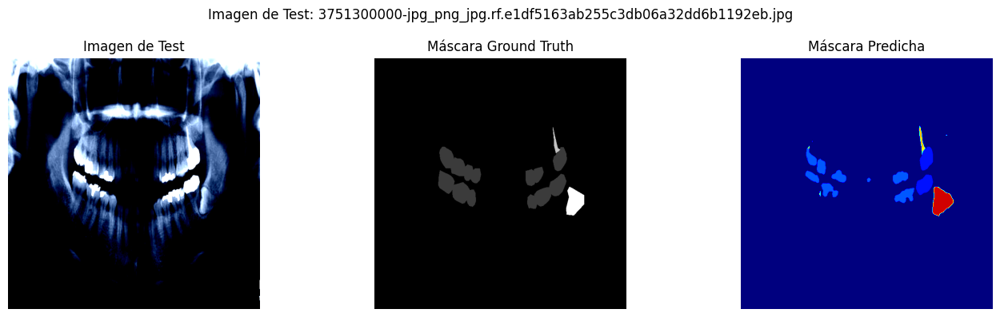

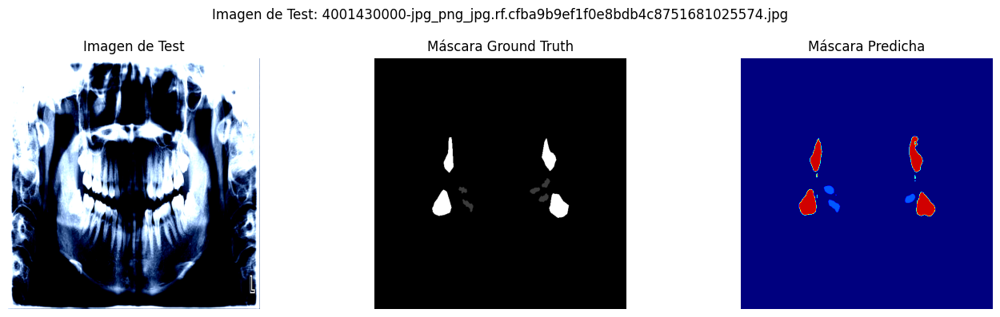

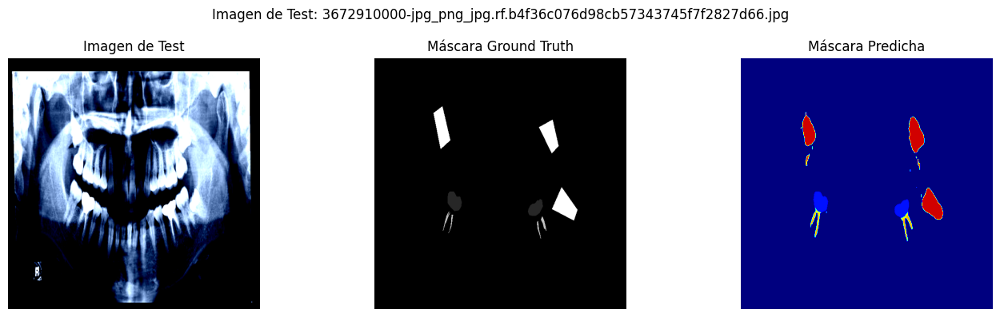

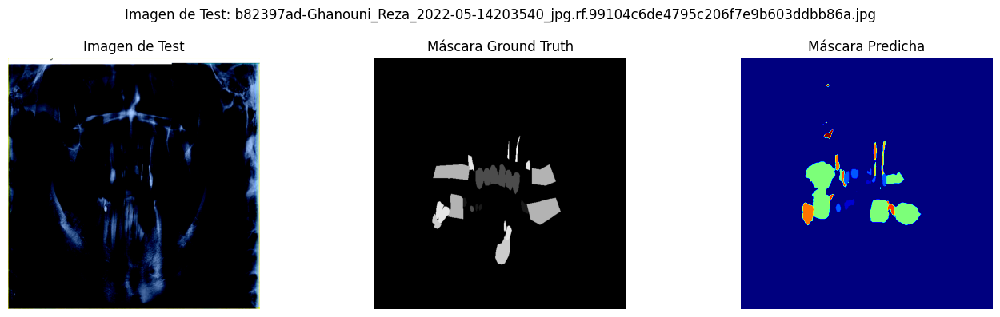

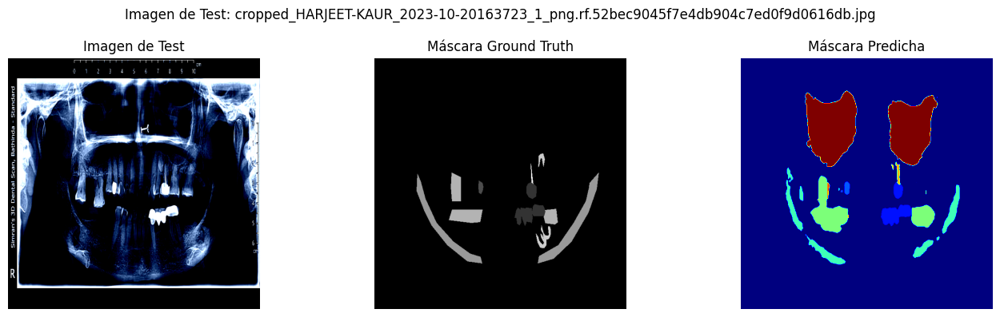

...

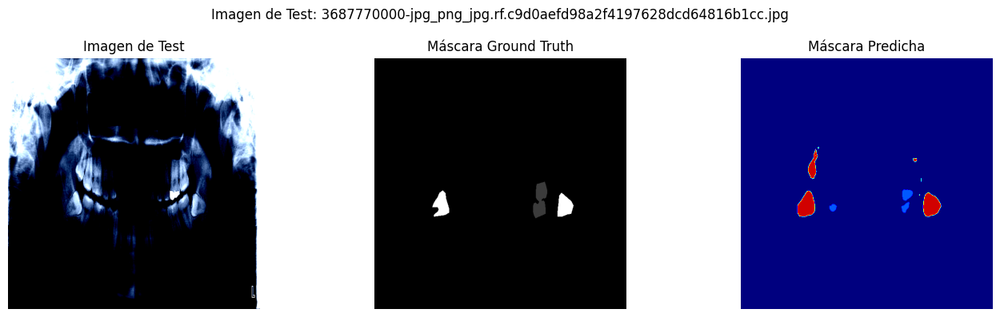

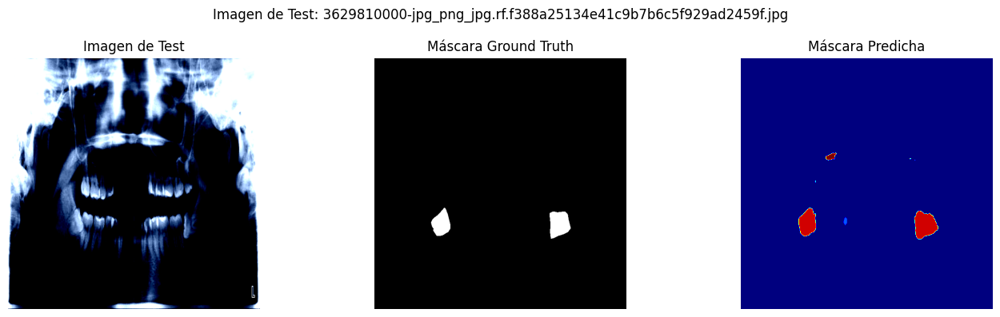

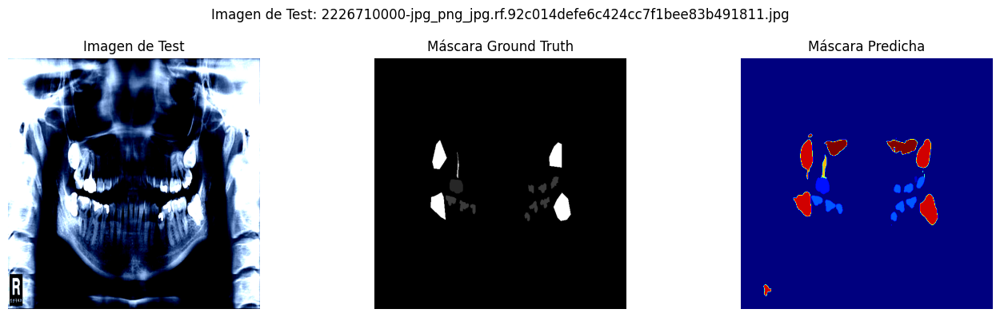

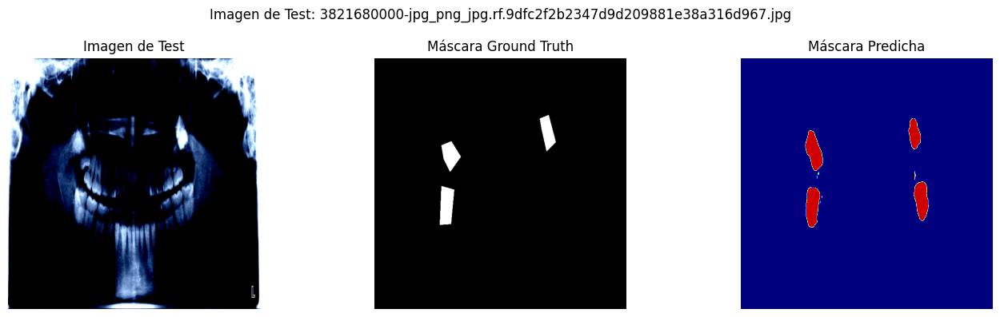

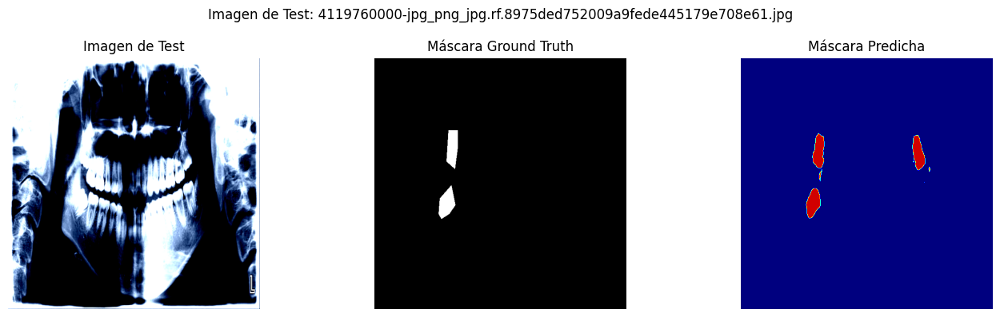

In [ ]:
import os
import glob
import random
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import albumentations as A      
from albumentations.pytorch import ToTensorV2
import cv2
from PIL import Image
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# --------------------------------------------------
# 1. Transformación para Test: resize, normalize, ToTensorV2
# --------------------------------------------------

test_transform = A.Compose([
    A.Resize(640, 640),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], p=1.0)

# Definición del Dataset adaptado para lesiones dentales
class LesionDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        
        self.image_names = []
        for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp"]:
            self.image_names.extend(glob.glob(os.path.join(images_dir, ext)))
        self.image_names = sorted(self.image_names, key=lambda x: os.path.basename(x))
        
    def __len__(self):
        return len(self.image_names)
    
    def __getitem__(self, idx):
        img_path = self.image_names[idx]
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        mask_path = os.path.join(self.masks_dir, base_name + ".png")
        if not os.path.exists(mask_path):
            mask_path = os.path.join(self.masks_dir, base_name + ".jpg")
        
        image = Image.open(img_path).convert("RGB")
        image = np.array(image)
        
        try:
            mask = Image.open(mask_path).convert("L")
            mask = np.array(mask)
        except Exception:
            mask = np.zeros(image.shape[:2], dtype=np.uint8)
        
        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"].long()
        else:
            image = torch.from_numpy(image).permute(2, 0, 1).float()/255.0
            mask = torch.from_numpy(mask).long()
        
        return image, mask

# Crear DataLoader para el conjunto de test
TEST_IMAGES_DIR = "test"
TEST_MASKS_DIR = "testmasks"

test_dataset = LesionDataset(TEST_IMAGES_DIR, TEST_MASKS_DIR, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# Configurar y cargar el modelo Segformer adaptado para lesiones dentales
num_classes = 15  # fondo + 14 tipos de lesiones dentales

model = smp.Segformer(
    encoder_name="resnet18",
    encoder_depth=5,
    encoder_weights="imagenet",
    decoder_channels=(256, 128, 64, 32, 16),
    squeeze_ratio=1,
    expansion_ratio=1,
    in_channels=3,
    classes=num_classes,
    activation=None
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Cargar el modelo entrenado
model_path = "results/best_effunetppv2.pth"
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# Visualización individual de algunas imágenes de test
num_samples = 20  # número de imágenes a visualizar
indices = random.sample(range(len(test_dataset)), num_samples)

for idx in indices:
    image, mask_gt = test_dataset[idx]
    image = image.to(device)
    mask_gt = mask_gt.to(device)
    
    with torch.no_grad():
        output = model(image.unsqueeze(0))
        class_map = torch.argmax(output, dim=1).squeeze(0)
        prob_max = torch.max(output, dim=1).values.squeeze(0)
        mask_pred = torch.where(prob_max > 0, class_map, torch.tensor(-1, device=device)).cpu().numpy()
    
    image_np = image.cpu().numpy()
    image_np = np.clip(image_np.transpose(1, 2, 0), 0, 1)
    
    mask_gt_np = mask_gt.squeeze(0).cpu().numpy()
    
    plt.figure(figsize=(14,4))
    plt.subplot(1,3,1)
    plt.imshow(image_np)
    plt.title("Imagen de Test")
    plt.axis("off")
    
    plt.subplot(1,3,2)
    plt.imshow(mask_gt_np, cmap='gray')
    plt.title("Máscara Ground Truth")
    plt.axis("off")
    
    plt.subplot(1,3,3)
    plt.imshow(mask_pred, cmap='jet', vmin=0, vmax=num_classes-1)  # Colormap dinámico
    plt.title("Máscara Predicha")
    plt.axis("off")
    
    plt.suptitle(f"Imagen de Test: {os.path.basename(test_dataset.image_names[idx])}")
    plt.tight_layout()
    plt.show()


Evaluando presencia/ausencia: 100%|██████████| 1580/1580 [00:41<00:00, 37.65it/s]


=== Evaluación a nivel de imagen (detección de lesiones, ignorando fondo) ===

Clase 1 (vzrad2):
Matriz de Confusión: [[209 141] [58 1172]]
Precision: 0.597
Sensibilidad (Recall): 0.783
Especificidad: 0.977
Accuracy: 0.874
F1 Score: 0.677

Clase 2 (Caries):
Matriz de Confusión: [[414 292] [1 873]]
Precision: 0.586
Sensibilidad (Recall): 0.998
Especificidad: 0.937
Accuracy: 0.815
F1 Score: 0.739

Clase 3 (Crown):
Matriz de Confusión: [[1094 243] [32 211]]
Precision: 0.818
Sensibilidad (Recall): 0.972
Especificidad: 0.813
Accuracy: 0.826
F1 Score: 0.888

Clase 4 (Filling):
Matriz de Confusión: [[58 26] [0 1496]]
Precision: 0.690
Sensibilidad (Recall): 1.000
Especificidad: 0.997
Accuracy: 0.984
F1 Score: 0.817

Clase 5 (Implant):
Matriz de Confusión: [[0 142] [1 1437]]
Precision: 0.000
Sensibilidad (Recall): 0.000
Especificidad: 0.981
Accuracy: 0.909
F1 Score: 0.000

Clase 6 (Malaligned):
Matriz de Confusión: [[21 143] [0 1416]]
Precision: 0.128
Sensibilidad (Recall): 1.000
Especificidad:

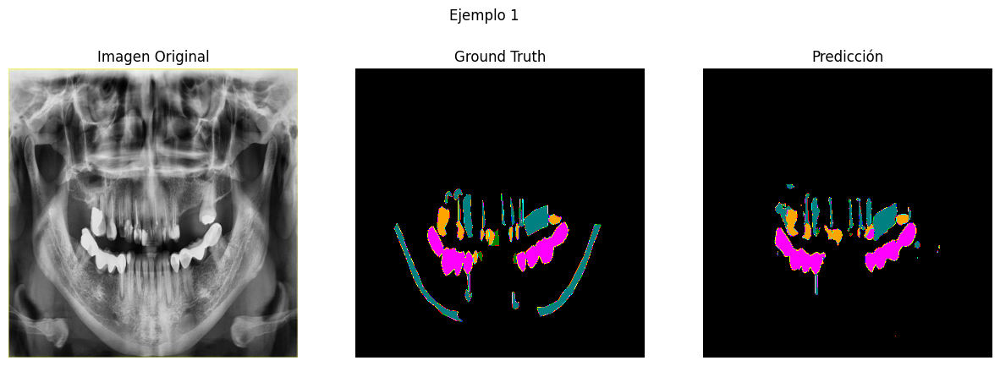

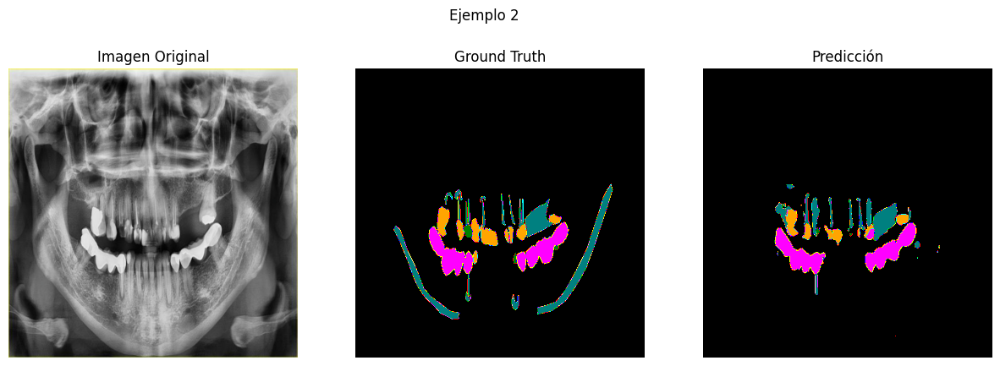

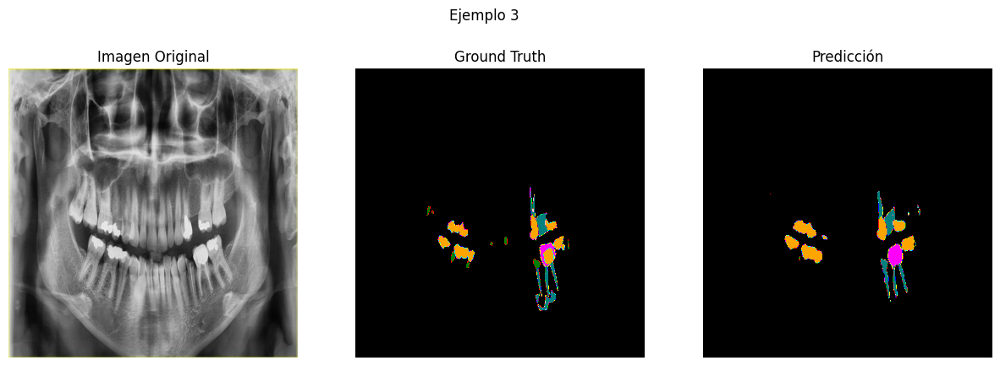

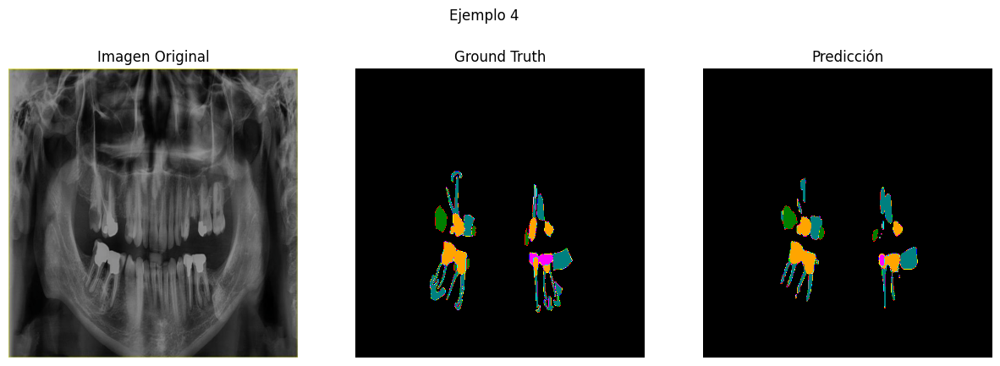

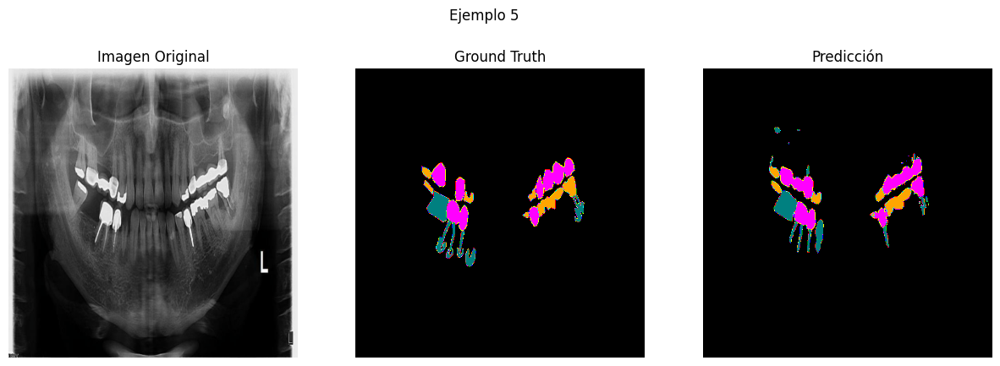

...

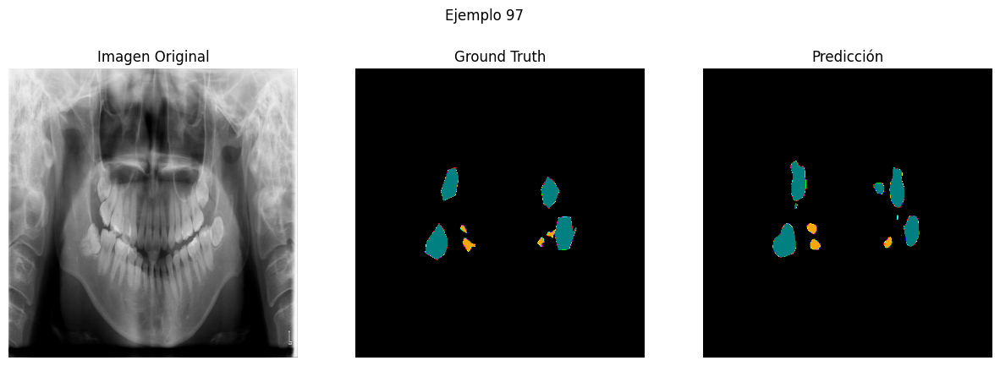

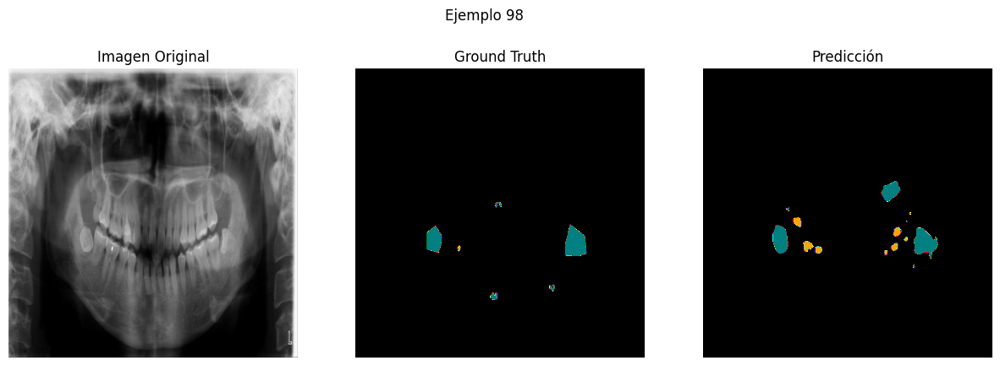

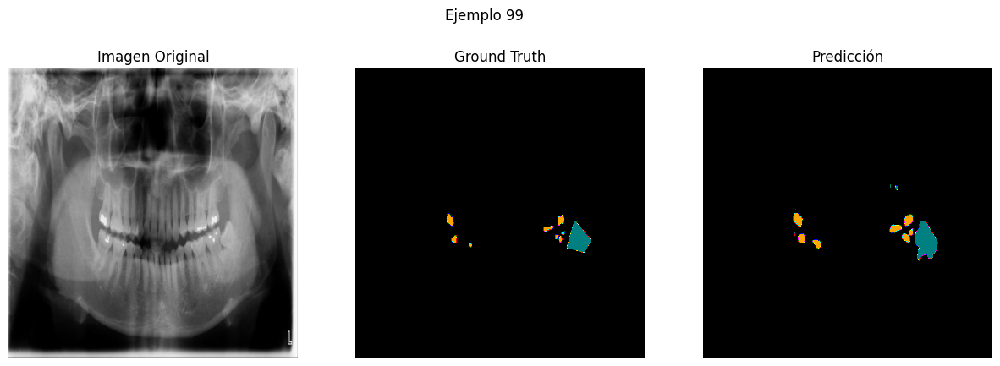

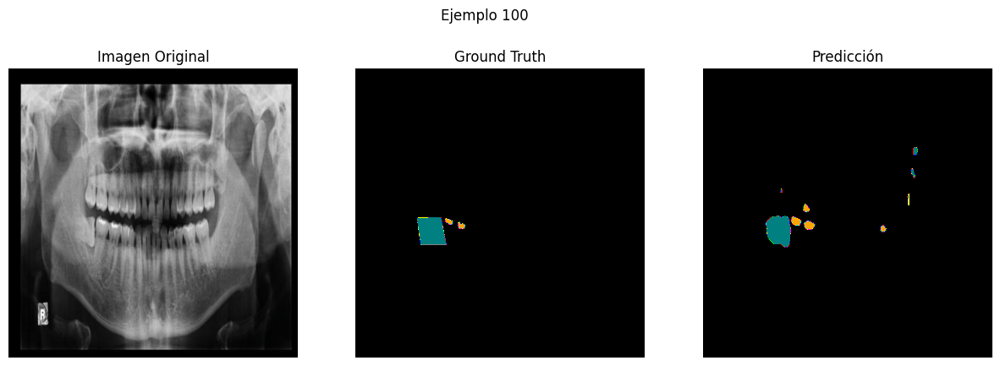

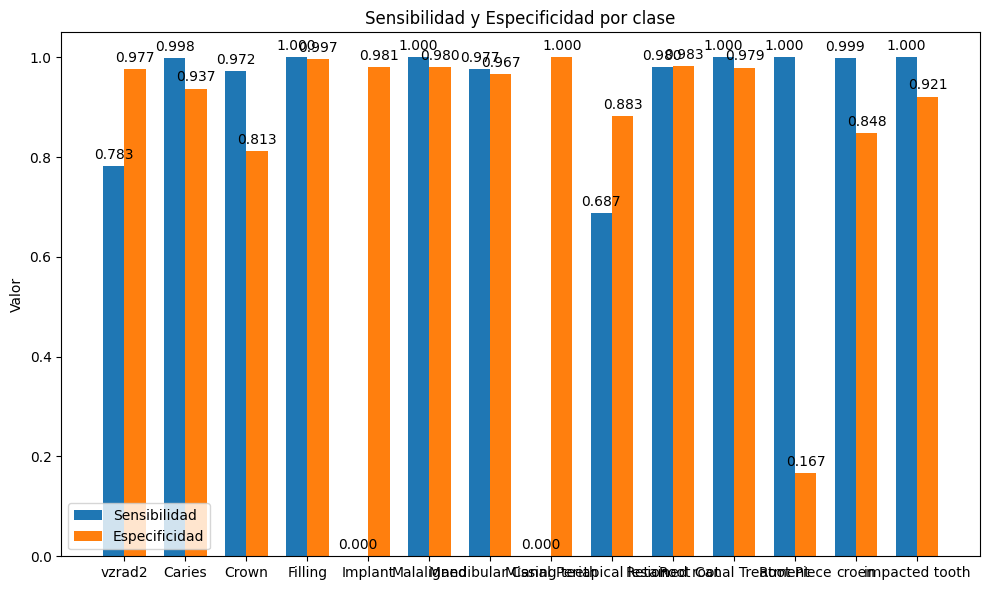

In [ ]:
import os
import glob
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image                               
import segmentation_models_pytorch as smp
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# =============================================================================
# 1. Transformación de test (mismo preprocesamiento que en entrenamiento)
# =============================================================================
test_transform = A.Compose([
    A.Resize(640, 640),  # Se usa el mismo tamaño que en el entrenamiento
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], p=1.0)

# =============================================================================
# 2. Dataset para segmentación semántica con 15 clases 
# =============================================================================
class LesionDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None, remap=True):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.remap = remap

        # Recolectar nombres de imágenes
        self.image_names = []
        for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp"]:
            self.image_names.extend(glob.glob(os.path.join(images_dir, ext)))
        self.image_names = sorted(self.image_names, key=lambda x: os.path.basename(x))

        self.val_to_class = {
            0: 0,
            1: 1,
            2: 2,
            3: 3,
            4: 4,
            5: 5,
            6: 6,
            7: 7,
            8: 8,
            9: 9,
            10: 10,
            11: 11,
            12: 12,
            13: 13,
            14: 14
        }

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        img_path = self.image_names[idx]
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        # Buscar la máscara (primero .png, si no existe, .jpg)
        mask_path = os.path.join(self.masks_dir, base_name + ".png")
        if not os.path.exists(mask_path):
            mask_path = os.path.join(self.masks_dir, base_name + ".jpg")

        image = Image.open(img_path).convert("RGB")
        image = np.array(image)

        try:
            mask = Image.open(mask_path).convert("L")
            mask = np.array(mask)
        except Exception:
            mask = np.zeros(image.shape[:2], dtype=np.uint8)

        # Remapear la máscara a [0..14]
        if self.remap:
            mapped_mask = np.zeros_like(mask, dtype=np.uint8)
            for old_val, new_val in self.val_to_class.items():
                mapped_mask[mask == old_val] = new_val
            mask = mapped_mask

        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]        # Tensor [3, H, W]
            mask = augmented["mask"].long()     # Tensor [H, W]
        else:
            image = torch.from_numpy(image).permute(2, 0, 1).float()/255.0
            mask = torch.from_numpy(mask).long()

        return image, mask

# =============================================================================
# 3. DataLoader de test
# =============================================================================
TEST_IMAGES_DIR = "test"
TEST_MASKS_DIR = "testmasks"

test_dataset = LesionDataset(TEST_IMAGES_DIR, TEST_MASKS_DIR, transform=test_transform, remap=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# =============================================================================
# 4. Cargar el modelo Segformer entrenado para 15 clases
# =============================================================================
num_classes = 15 
model = smp.Segformer(
    encoder_name="resnet18",
    encoder_depth=5,
    encoder_weights="imagenet",
    decoder_channels=(256, 128, 64, 32, 16),
    squeeze_ratio=1,
    expansion_ratio=1,
    in_channels=3,
    classes=num_classes,
    activation=None
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model_path = "results/best_effunetppv2.pth"
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# =============================================================================
# 5. Evaluación a nivel de imagen (presencia/ausencia) para cada clase de lesión (excluyendo fondo)
# =============================================================================
# Definimos umbrales específicos para cada clase en un diccionario.
# Por ejemplo, para Callos (clase 1) podríamos usar un umbral mayor (0.7) para aumentar la especificidad,
# y para las otras clases un umbral de 0.5 para mejorar la sensibilidad.

thresholds = {
    0: 0.3,
    1: 0.5,
    2: 0.2,
    3: 0.4,
    4: 0.25,
    5: 0.35,
    6: 0.45,
    7: 0.2,
    8: 0.3,
    9: 0.15,
    10: 0.5,
    11: 0.4,
    12: 0.3,
    13: 0.6,
    14: 0.25
}

# Se evaluará la presencia de cada clase (1 a 6) usando softmax y el umbral específico.
presence_confusion = {c: np.array([0, 0, 0, 0], dtype=np.int64) for c in range(1, num_classes)}

with torch.no_grad():
    for images, masks_gt in tqdm(test_loader, desc="Evaluando presencia/ausencia"):
        images = images.to(device)      # (B, 3, H, W)
        masks_gt = masks_gt.to(device)    # (B, H, W) con valores 0..6

        outputs = model(images)         # (B, 7, H, W)
        probs = torch.softmax(outputs, dim=1)  # (B, 7, H, W)

        # Se trabaja con batch_size=1:
        for c in range(1, num_classes):
            current_threshold = thresholds[c]
            # Se considera que la clase c está presente en la predicción si en algún píxel la probabilidad supera el umbral
            presence_pred = (probs[0, c, :, :] > current_threshold).any().item()
            presence_gt = (masks_gt[0] == c).any().item()

            if presence_gt and presence_pred:
                presence_confusion[c][0] += 1   # TP
            elif (not presence_gt) and presence_pred:
                presence_confusion[c][1] += 1   # FP
            elif presence_gt and (not presence_pred):
                presence_confusion[c][2] += 1   # FN
            else:
                presence_confusion[c][3] += 1   # TN

# =============================================================================
# 6. Cálculo de métricas por clase (matriz de confusión, sensibilidad, especificidad, accuracy, F1)
#    Se utiliza una fórmula que penaliza los FP con un factor alpha para "relajar" la especificidad.
# =============================================================================
print("=== Evaluación a nivel de imagen (detección de lesiones, ignorando fondo) ===")

clase_nombres = {
    1: 'vzrad2',
    2: 'Caries',
    3: 'Crown',
    4: 'Filling',
    5: 'Implant',
    6: 'Malaligned',
    7: 'Mandibular Canal',
    8: 'Missing teeth',
    9: 'Periapical lesion',
    10: 'Retained root',
    11: 'Root Canal Treatment',
    12: 'Root Piece',
    13: 'croen',
    14: 'impacted tooth',
    15: 'maxillary sinus'
}

epsilon = 1e-7  # Para evitar divisiones por cero
alpha = 0.2     # Factor de penalización para FP en la especificidad

# Listas para guardar métricas para el gráfico
sensitivity_list = []
specificity_list = []
class_labels = []

for c in range(1, num_classes):
    TP, FP, FN, TN = presence_confusion[c]
    sensitivity = TP / (TP + FN + epsilon)    # Recall
    specificity_relaxed = TN / (TN + alpha * FP + epsilon)
    
    print(f"\nClase {c} ({clase_nombres[c]}):")
    print(f"Matriz de Confusión: [[{TP} {FP}] [{FN} {TN}]]")
    print(f"Precision: {TP / (TP + FP + epsilon):.3f}")
    print(f"Sensibilidad (Recall): {sensitivity:.3f}")
    print(f"Especificidad: {specificity_relaxed:.3f}")
    print(f"Accuracy: {(TP + TN) / (TP + FP + FN + TN + epsilon):.3f}")
    print(f"F1 Score: {2 * (TP / (TP + FP + epsilon)) * sensitivity / ((TP / (TP + FP + epsilon)) + sensitivity + epsilon):.3f}")
    
    sensitivity_list.append(sensitivity)
    specificity_list.append(specificity_relaxed)
    class_labels.append(clase_nombres[c])

# =============================================================================
# 7. Visualización de 50 ejemplos: Imagen Original, Ground Truth y Predicción
# =============================================================================
cmap = ListedColormap([
    'black',       # 0
    'red',         # 1
    'green',       # 2
    'blue',        # 3
    'yellow',      # 4
    'magenta',     # 5
    'cyan',        # 6
    'orange',      # 7
    'purple',      # 8
    'lime',        # 9
    'brown',       # 10
    'pink',        # 11
    'gray',        # 12
    'olive',       # 13
    'teal'         # 14
])

def denormalize(img_tensor):
    """Función para desnormalizar la imagen a rango [0,1]."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img * std + mean
    img = np.clip(img, 0, 1)
    return img

print("\nMostrando 50 ejemplos de predicciones...")
count = 0
for img, mask_gt in test_loader:
    if count >=100:
        break
    img = img.to(device)
    with torch.no_grad():
        output = model(img)  # (1, 7, H, W)
        pred = torch.argmax(output, dim=1)  # (1, H, W)
    
    img_denorm = denormalize(img[0])
    mask_gt_np = mask_gt.squeeze(0).cpu().numpy()
    pred_np = pred.squeeze(0).cpu().numpy()
    
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img_denorm)
    plt.title("Imagen Original")
    plt.axis("off")
    
    plt.subplot(1,3,2)
    plt.imshow(mask_gt_np, cmap=cmap, vmin=0, vmax=6)
    plt.title("Ground Truth")
    plt.axis("off")
    
    plt.subplot(1,3,3)
    plt.imshow(pred_np, cmap=cmap, vmin=0, vmax=6)
    plt.title("Predicción")
    plt.axis("off")
    
    plt.suptitle(f"Ejemplo {count+1}")
    plt.show()
    
    count += 1

# =============================================================================
# 8. Gráfico de barras: Sensibilidad y Especificidad por clase
#    Se mostrará un gráfico con dos barras por clase: Sensibilidad y Especificidad.
# =============================================================================
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(len(class_labels))  # Posiciones para cada clase
width = 0.35  # Ancho de cada barra

fig, ax = plt.subplots(figsize=(10,6))
rects1 = ax.bar(x - width/2, sensitivity_list, width, label='Sensibilidad')
rects2 = ax.bar(x + width/2, specificity_list, width, label='Especificidad')

ax.set_ylabel('Valor')
ax.set_title('Sensibilidad y Especificidad por clase')
ax.set_xticks(x)
ax.set_xticklabels(class_labels)
ax.legend()

def autolabel(rects):
    """Añade una etiqueta numérica encima de cada barra."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(rect.get_x() + rect.get_width()/2, height),
                    xytext=(0,3),
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.show()
